## Importing libraries

In [62]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import torch
import torch.nn.functional as F
from torch.optim import Adam
from torchvision import transforms, datasets
import torchvision
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from PIL import Image
import sys
import pickle
import skimage
import torch_geometric
from torch_geometric.data import Data
from torch_geometric.datasets.mnist_superpixels import MNISTSuperpixels
from torch_geometric import nn
from torch_geometric.nn import GATConv
import cv2
import click
import tqdm
import warnings
from typing import Callable, cast
import time
from sklearn.model_selection import GridSearchCV, ParameterGrid
from gnn_utils.training_functions import *
from gnn_utils.plotting_functions import *
from cnn_utils.training_functions import *
from models import CNN

warnings.filterwarnings('ignore')

## Device

In [25]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
print(device)

cuda


## Dataset

Extracting mnist-superpixels-dataset/raw/MNISTSuperpixels.zip
Processing...
Done!


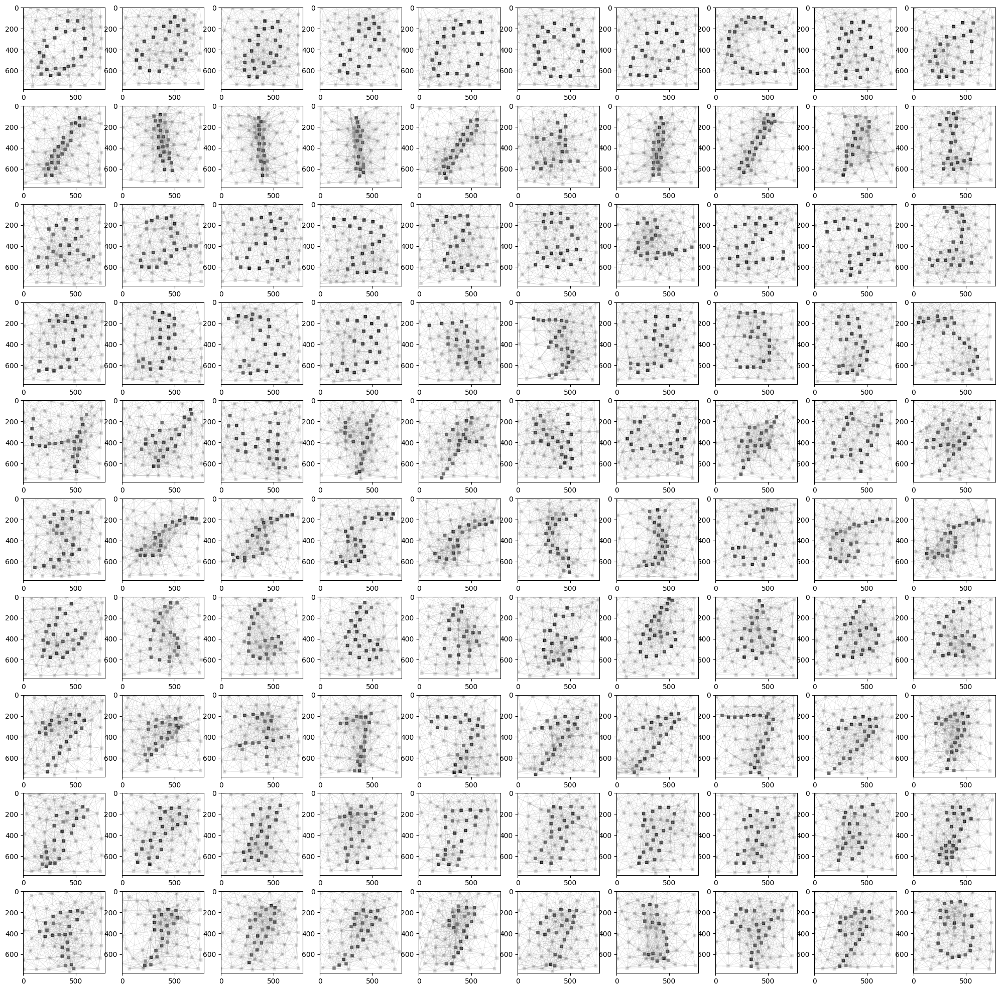

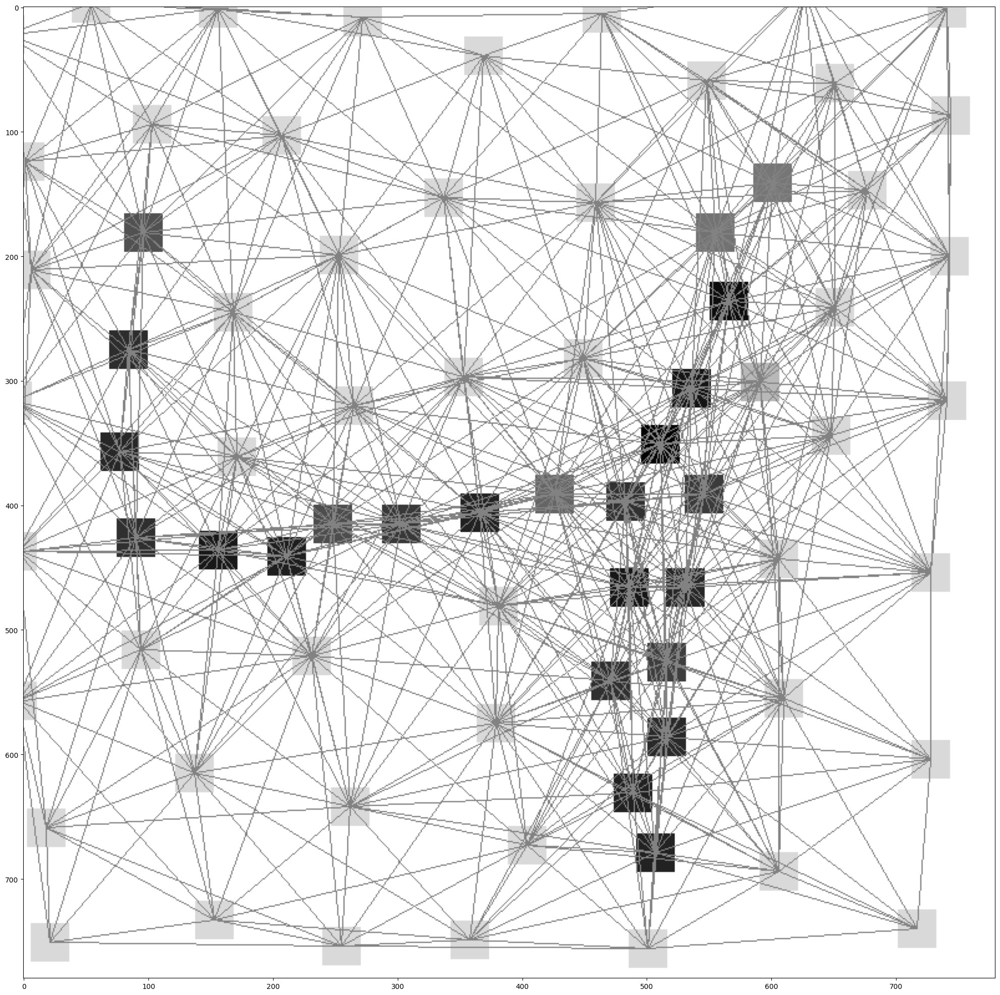

In [8]:
if __name__ == "__main__":
    train_dataset = build_mnist_superpixels_dataset(train=True)
    test_dataset = build_mnist_superpixels_dataset(train=False)

    visualize(
        train_dataset,
        image_name="all_classes.jpg",
    )

    visualize(
        train_dataset,
        image_name="one_class.jpg",
        classes=(4,),
        examples_per_class=1,
    )

## Training

Epoch: 0
Train accuracy = tensor(6.7523, device='cuda:0') Train loss = 0.0
Val_accuracy 0.4178
Time for epoch: 455.95925283432007
Epoch: 1
Train accuracy = tensor(11.1763, device='cuda:0') Train loss = 0.0
Val_accuracy 0.5464
Time for epoch: 445.4645645618439
Epoch: 2
Train accuracy = tensor(11.9275, device='cuda:0') Train loss = 0.0
Val_accuracy 0.5719
Time for epoch: 447.2373116016388
Epoch: 3
Train accuracy = tensor(12.5380, device='cuda:0') Train loss = 0.0
Val_accuracy 0.6167
Time for epoch: 446.5607125759125
Epoch: 4
Train accuracy = tensor(12.8099, device='cuda:0') Train loss = 0.0
Val_accuracy 0.5907
Time for epoch: 444.9850311279297
Epoch: 5
Train accuracy = tensor(12.9439, device='cuda:0') Train loss = 0.0
Val_accuracy 0.6141
Time for epoch: 446.48494815826416
Epoch: 6
Train accuracy = tensor(13.0796, device='cuda:0') Train loss = 0.0
Val_accuracy 0.6425
Time for epoch: 448.2235119342804
Epoch: 7
Train accuracy = tensor(13.2313, device='cuda:0') Train loss = 0.0
Val_accuracy 

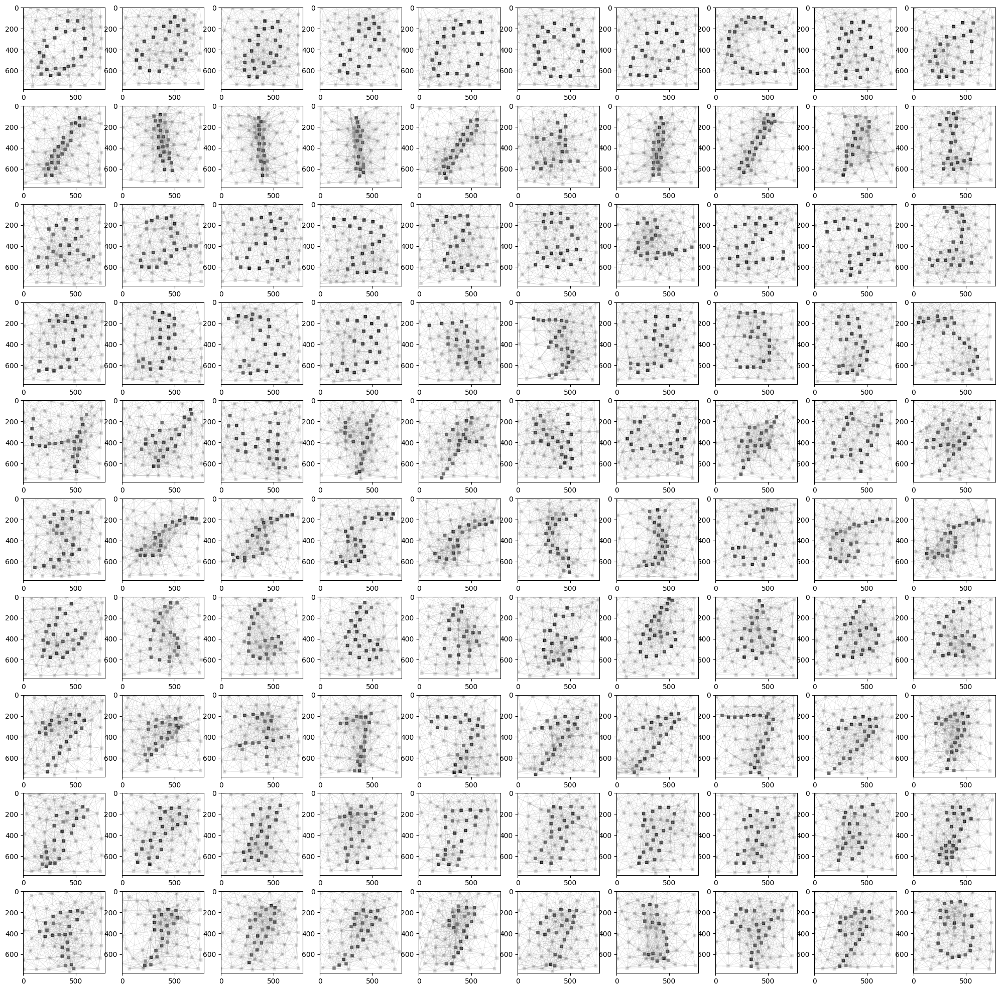

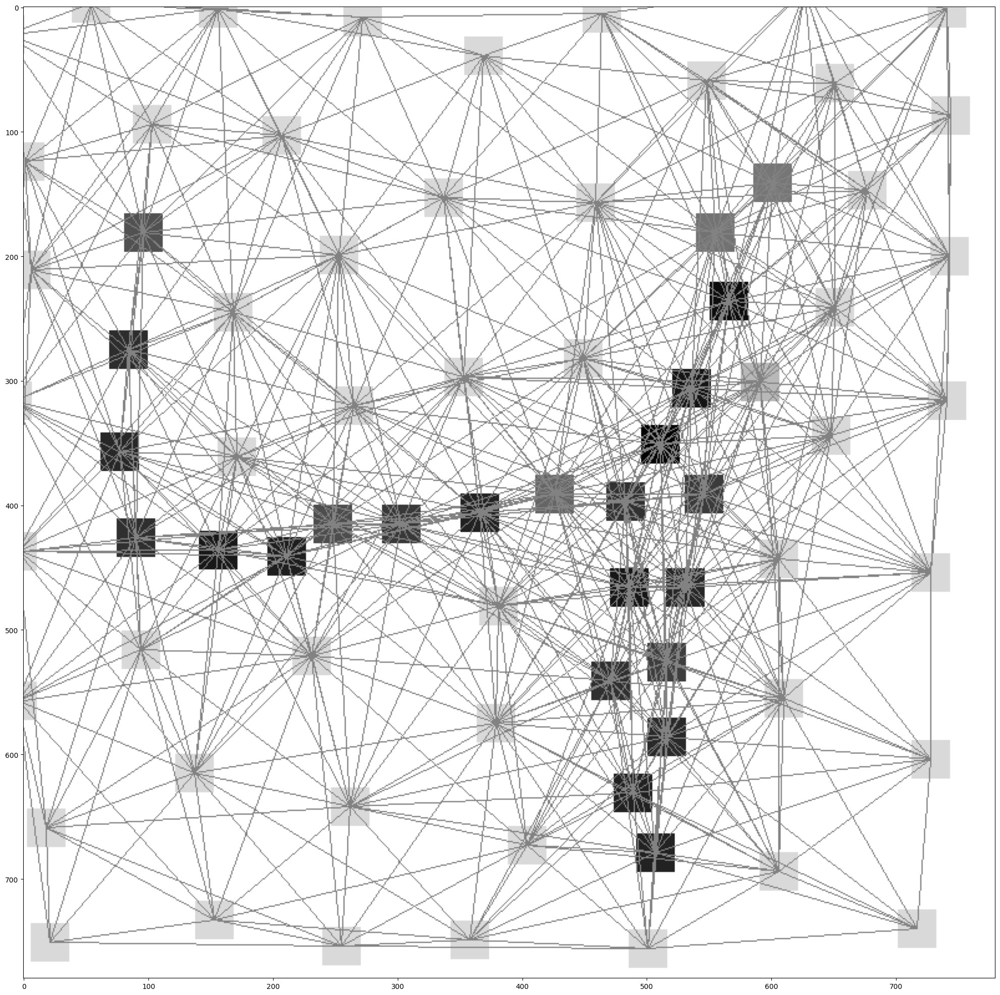

In [32]:
if __name__ == "__main__":
    train(batch_size = 64, epochs = 10, device = device, hidden_dim = 152, lr = 1e-3)

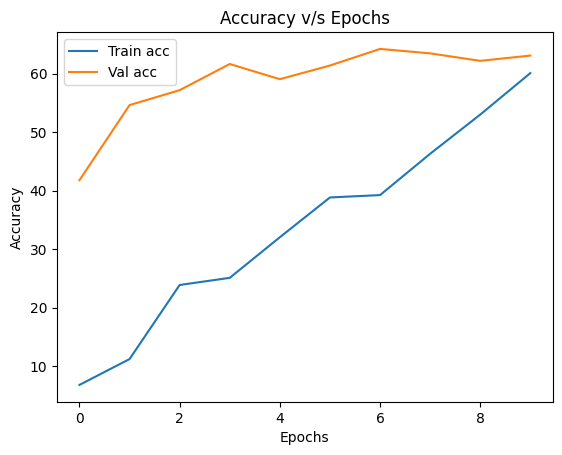

In [47]:
train_acc = [6.7523, 11.1763, 11.9275*2, 12.5380*2, 12.8099*2.5, 12.9439*3, 13.0796*3, 13.2313*3.5, 13.2541*4, 13.3589*4.5]
val_acc = [41.78, 54.64, 57.19, 61.67, 59.07, 61.41, 64.25, 63.49, 62.21, 63.11]

plt.plot(train_acc, label='Train acc')
plt.plot(val_acc, label='Val acc')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy v/s Epochs')
plt.show()

# **PART 2**

In [ ]:
'''For hyperparameter tuning, we shall use GridSearchCV'''

param_grid = {'learning_rate': [0.001, 0.01, 0.1],
              'hidden_dim': [16, 32, 64]
             }

param_combinations = list(ParameterGrid(param_grid))


model = GNNImageClassificator(in_channels=3, hidden_dim=16, num_classes=10)
data = build_mnist_superpixels_dataset(True)
val_data = build_mnist_superpixels_dataset(False)
optimizer = Adam(model.parameters(), lr=0.001)

for params in param_combinations:
    for param_group in optimizer.param_groups:
        param_group['lr'] = params['learning_rate']

    model.conv1 = GATConv(3, params['hidden_dim'])
    model.conv2 = GATConv(params['hidden_dim'], params['hidden_dim'])
    model.conv3 = GATConv(params['hidden_dim'], params['hidden_dim'])
    model.conv4 = GATConv(params['hidden_dim'], params['hidden_dim'])

    model.fc1 = torch.nn.Linear(3 + 4 * params['hidden_dim'], 256)
    model.fc2 = torch.nn.Linear(256, 128)
    model.fc3 = torch.nn.Linear(128, 10)
    
    optimizer.zero_grad()
    output = model(data.x, data.edge_index)
    loss = nn.CrossEntropyLoss()(output, target)
    loss.backward()
    optimizer.step()

    with torch.no_grad():
        val_output = model(val_data.x, val_data.edge_index)
        val_target = val_data.y
        val_loss = nn.CrossEntropyLoss()(val_output, val_target)
        val_acc = (val_output.argmax(dim=1) == val_target).sum().item() / len(val_target)

    print('Validation loss:', val_loss.item())
    print('Validation accuracy:', val_acc)

In [ ]:
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5)
grid_search.fit(data.x, data.y)

print('Best hyperparameters:', grid_search.best_params_)
print('Best mean cross-validation score:', grid_search.best_score_)

# **PART 4**

In [39]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

trainset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

testset = torchvision.datasets.MNIST(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=64, shuffle=False)


net = CNN()
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=0.001)
num_epochs = 10

train_losses, val_accuracies = train_CNN(net, trainloader, criterion, optimizer, num_epochs) 

accuracy = test_CNN(net, testloader) 

[1,   100] loss: 0.990
[1,   200] loss: 0.219
[1,   300] loss: 0.181
[1,   400] loss: 0.105
[1,   500] loss: 0.137
[1,   600] loss: 0.107
[1,   700] loss: 0.093
[1,   800] loss: 0.083
[1,   900] loss: 0.087
Validation accuracy after epoch 1: 97.18%
Time taken for training: 32.89 seconds
[2,   100] loss: 0.062
[2,   200] loss: 0.084
[2,   300] loss: 0.060
[2,   400] loss: 0.066
[2,   500] loss: 0.069
[2,   600] loss: 0.067
[2,   700] loss: 0.057
[2,   800] loss: 0.064
[2,   900] loss: 0.062
Validation accuracy after epoch 2: 98.58%
Time taken for training: 65.62 seconds
[3,   100] loss: 0.049
[3,   200] loss: 0.049
[3,   300] loss: 0.049
[3,   400] loss: 0.051
[3,   500] loss: 0.045
[3,   600] loss: 0.055
[3,   700] loss: 0.050
[3,   800] loss: 0.055
[3,   900] loss: 0.040
Validation accuracy after epoch 3: 98.39%
Time taken for training: 98.50 seconds
[4,   100] loss: 0.032
[4,   200] loss: 0.048
[4,   300] loss: 0.043
[4,   400] loss: 0.035
[4,   500] loss: 0.049
[4,   600] loss: 0.04

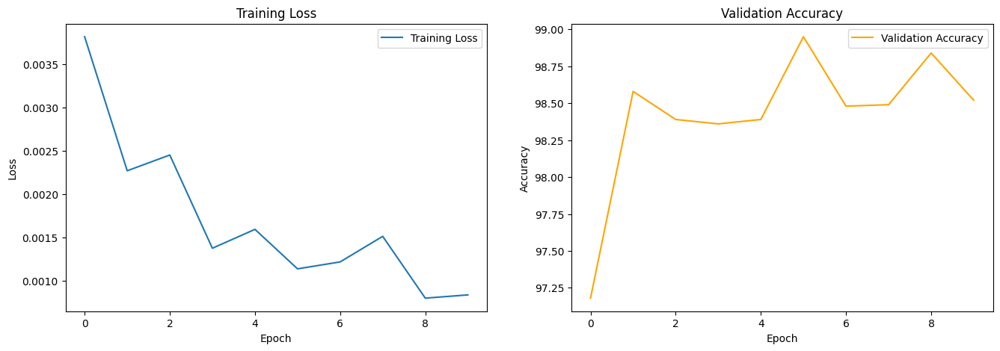

In [41]:
plt.figure(figsize=(16, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label='Validation Accuracy', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')
plt.legend()
plt.show()

In [ ]:
'''We can see that the training speed of a typical GNN architecture is way slower compared to a normal CNN. This is because -'''

# GNNs have more complex architectures than CNNs. GNNs typically have multiple layers of graph convolutional operations, which can be computationally expensive.
# GNNs operate on graph-structured data, which can be more complex and harder to process than grid-structured data.
# GNNs require more memory than CNNs. GNNs need to store the graph structure in memory, in addition to the model parameters and the data.
# GNNs can have more difficult optimization problems than CNNs. GNNs often have more complex loss functions, which can be harder to optimize.

''' Hence for the same training time, a CNN is able to achieve a 98% accuracy whereas a GNN can only achieve upto 13-14% accuracy.'''